 ## <div style="text-align: left">Simple EDA IEEE : Vesta Fraud Data </div> 

![](https://cdn1.imggmi.com/uploads/2019/8/7/884ef7fecc277f2c58396ed766d3d569-full.png)

<br>
<div style="text-align: left">
Vesta Corporation provided the dataset for this competition. Vesta Corporation is the forerunner in guaranteed e-commerce payment solutions. Founded in 1995, Vesta pioneered the process of fully guaranteed card-not-present (CNP) payment transactions for the telecommunications industry. Since then, Vesta has firmly expanded data science and machine learning capabilities across the globe and solidified its position as the leader in guaranteed ecommerce payments. Today, Vesta guarantees more than $18B in transactions annually.

In this competition, you’ll benchmark machine learning models on a challenging large-scale dataset. The data comes from Vesta's real-world e-commerce transactions and contains a wide range of features from device type to product features. You also have the opportunity to create new features to improve your results.</div>

In [1]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling as pp
import matplotlib.style as style 
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os

In [2]:
df_trans = pd.read_csv('../input/train_transaction.csv', index_col='TransactionID')
df_test_trans = pd.read_csv('../input/test_transaction.csv', index_col='TransactionID')

df_id = pd.read_csv('../input/train_identity.csv', index_col='TransactionID')
df_test_id = pd.read_csv('../input/test_identity.csv', index_col='TransactionID')


In [3]:
df_train = df_trans.merge(df_id, how='left', left_index=True, right_index=True)
df_test = df_test_trans.merge(df_test_id, how='left', left_index=True, right_index=True)

print(df_train.shape)
print(df_test.shape)
del df_trans,df_test_trans,df_id,df_test_id 

(590540, 433)
(506691, 432)


In [4]:
features = [c for c in df_train.columns if c not in ['isFraud']] #basic features

In [5]:
card_features=['card1', 'card2', 'card3', 'card4', 'card5', 'card6']
c_features=['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14']
d_features=[ 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15']
m_features=[ 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9']
v1_features=[ 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50']
v2_features=['V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95', 'V96', 'V97', 'V98', 'V99', 'V100']
v3_features=[  'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137', 'V138', 'V139', 'V140', 'V141', 'V142', 'V143', 'V144', 'V145', 'V146', 'V147', 'V148', 'V149', 'V150']
v4_features=[ 'V151', 'V152', 'V153', 'V154', 'V155', 'V156', 'V157', 'V158', 'V159', 'V160', 'V161', 'V162', 'V163', 'V164', 'V165', 'V166', 'V167', 'V168', 'V169', 'V170','V171', 'V172', 'V173', 'V174', 'V175', 'V176', 'V177', 'V178', 'V179', 'V180', 'V181', 'V182', 'V183', 'V184', 'V185', 'V186', 'V187', 'V188', 'V189', 'V190', 'V191', 'V192', 'V193', 'V194', 'V195', 'V196', 'V197', 'V198', 'V199', 'V200']
v5_features=['V201', 'V202', 'V203', 'V204', 'V205', 'V206', 'V207', 'V208', 'V209', 'V210', 'V211', 'V212', 'V213', 'V214', 'V215', 'V216', 'V217', 'V218', 'V219', 'V220', 'V221', 'V222', 'V223', 'V224', 'V225', 'V226', 'V227', 'V228', 'V229', 'V230', 'V231', 'V232', 'V233', 'V234', 'V235', 'V236', 'V237', 'V238', 'V239', 'V240', 'V241', 'V242', 'V243', 'V244', 'V245', 'V246', 'V247', 'V248', 'V249', 'V250',]
v6_features=[ 'V251', 'V252', 'V253', 'V254', 'V255', 'V256', 'V257', 'V258', 'V259', 'V260', 'V261', 'V262', 'V263', 'V264', 'V265', 'V266', 'V267', 'V268', 'V269', 'V270', 'V271', 'V272', 'V273', 'V274', 'V275', 'V276', 'V277', 'V278', 'V279', 'V280', 'V281', 'V282', 'V283', 'V284', 'V285', 'V286', 'V287', 'V288', 'V289', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V296', 'V297', 'V298', 'V299', 'V300']
v7_features=['V301', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 'V311', 'V312', 'V313', 'V314', 'V315', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321', 'V322', 'V323', 'V324', 'V325', 'V326', 'V327', 'V328', 'V329', 'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338', 'V339']
id_features=[ 'id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06', 'id_07', 'id_08', 'id_09', 'id_10', 'id_11', 'id_12', 'id_13', 'id_14', 'id_15', 'id_16', 'id_17', 'id_18', 'id_19', 'id_20', 'id_21', 'id_22', 'id_23', 'id_24', 'id_25', 'id_26', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_32', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38']
other_features=['TransactionDT', 'TransactionAmt', 'ProductCD' ,'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain', 'DeviceType', 'DeviceInfo']

In [6]:
FF=[card_features,c_features,d_features,m_features,v1_features,v2_features,v3_features,v4_features,v5_features,v6_features,v7_features,id_features,other_features]


In [7]:
df_train.fillna(-999,inplace=True)
df_test.fillna(-999,inplace=True)
from sklearn import preprocessing

for f in df_train[features]:
    if df_train[f].dtype=='object' or df_test[f].dtype=='object': 
        lbl = preprocessing.LabelEncoder()
        lbl.fit(list(df_train[f].values) + list(df_test[f].values))
        df_train[f] = lbl.transform(list(df_train[f].values))
        df_test[f] = lbl.transform(list(df_test[f].values)) 

In [8]:
# From kernel https://www.kaggle.com/gemartin/load-data-reduce-memory-usage
# WARNING! THIS CAN DAMAGE THE DATA 
def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

X_train = reduce_mem_usage(df_train)
X_test = reduce_mem_usage(df_test)

Memory usage of dataframe is 1975.37 MB
Memory usage after optimization is: 547.70 MB
Decreased by 72.3%
Memory usage of dataframe is 1693.87 MB
Memory usage after optimization is: 480.02 MB
Decreased by 71.7%


In [9]:
t0 = X_train.loc[X_train['isFraud'] == 0]
t1 = X_train.loc[X_train['isFraud'] == 1]

# Distribution plots of features

-999 value is injected for Nan values

## Card 1-6

<Figure size 432x288 with 0 Axes>

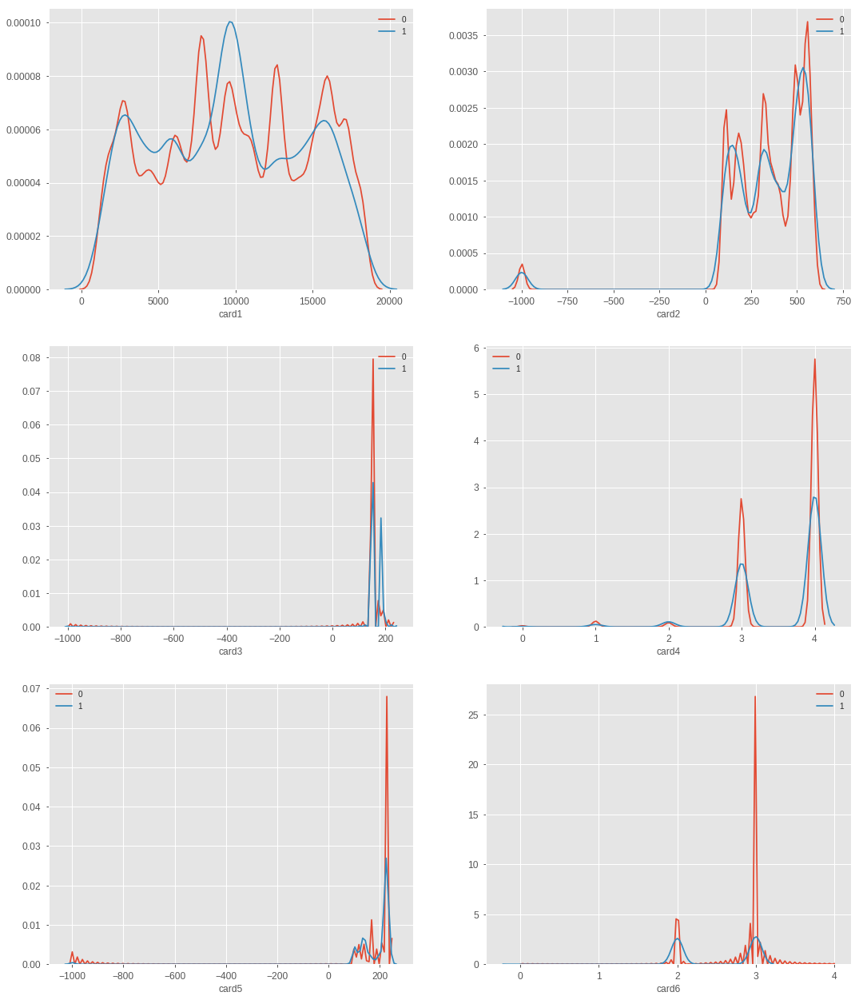

In [10]:
def card(df1, df2, label1, label2, features):
    i = 0
    style.use('ggplot')
    plt.figure()
    fig, ax = plt.subplots(3,2,figsize=(18,22))

    for feature in features:
        i += 1
        plt.subplot(3,2,i)
        sns.distplot(df1[feature], hist=False,label=label1)
        sns.distplot(df2[feature], hist=False,label=label2)
        plt.xlabel(feature, fontsize=12)
        locs, labels = plt.xticks()
        plt.tick_params(axis='x', which='major', labelsize=12, pad=6)
        plt.tick_params(axis='y', which='major', labelsize=12,pad=6)
    plt.show();

card(t0, t1, '0', '1', FF[0])            

## C 1-14

<Figure size 432x288 with 0 Axes>

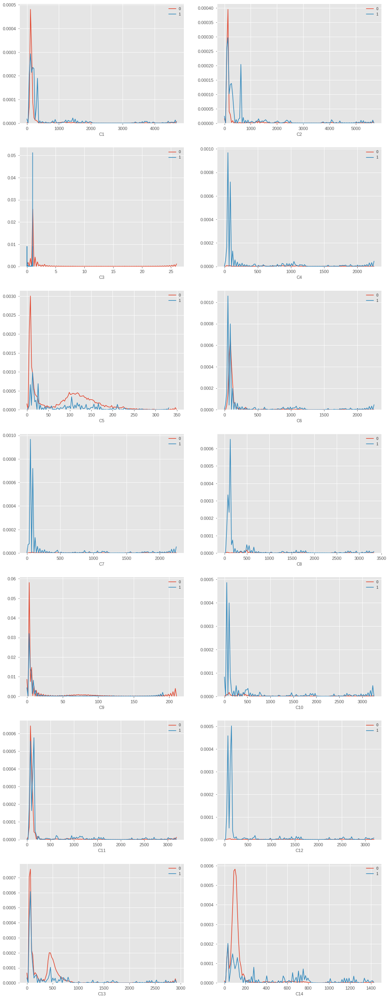

In [11]:
def c_ff(df1, df2, label1, label2, features):
    i = 0
    style.use('ggplot')
    plt.figure()
    fig, ax = plt.subplots(7,2,figsize=(18,50))

    for feature in features:
        i += 1
        plt.subplot(7,2,i)
        sns.distplot(df1[feature], hist=False,label=label1)
        sns.distplot(df2[feature], hist=False,label=label2)
        plt.xlabel(feature, fontsize=12)
        locs, labels = plt.xticks()
        plt.tick_params(axis='x', which='major', labelsize=12, pad=6)
        plt.tick_params(axis='y', which='major', labelsize=12,pad=6)
    plt.show();

c_ff(t0, t1, '0', '1', FF[1])            

## D 1-15

<Figure size 432x288 with 0 Axes>

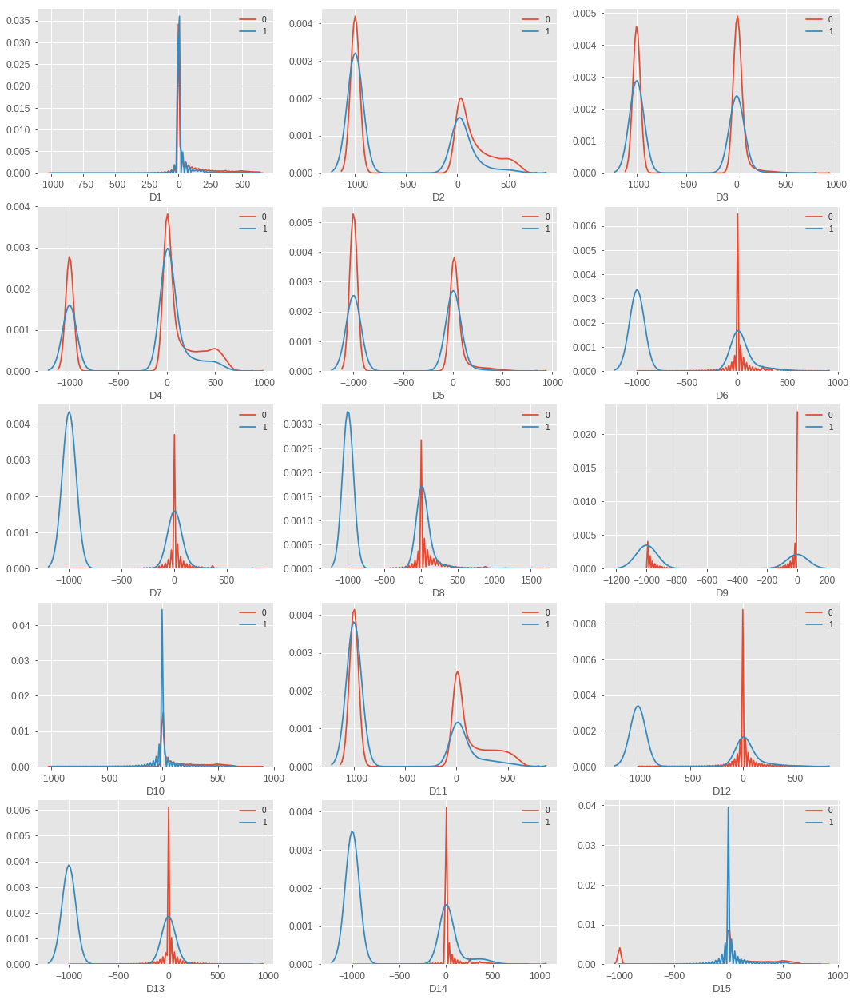

In [12]:
def d_ff(df1, df2, label1, label2, features):
    i = 0
    style.use('ggplot') 
    plt.figure()
    fig, ax = plt.subplots(5,3,figsize=(18,22))
    
    for feature in features:
        i += 1
        plt.subplot(5,3,i)
        sns.distplot(df1[feature], hist=False,label=label1)
        sns.distplot(df2[feature], hist=False,label=label2)
        plt.xlabel(feature, fontsize=13)
        locs, labels = plt.xticks()
        plt.tick_params(axis='x', which='major', labelsize=12, pad=6)
        plt.tick_params(axis='y', which='major', labelsize=12,pad=6)
    plt.show();

d_ff(t0, t1, '0', '1', FF[2])            

## M 1-9

<Figure size 432x288 with 0 Axes>

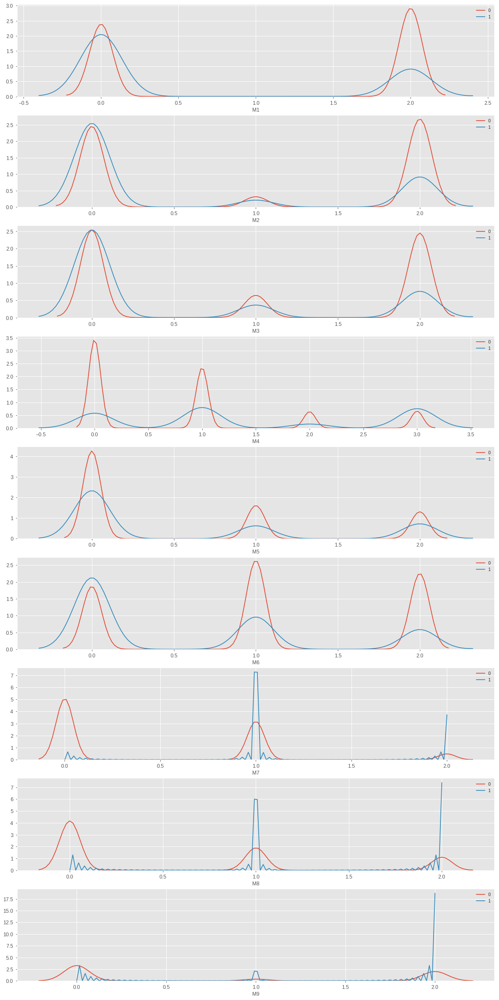

In [13]:
def m_ff(df1, df2, label1, label2, features):
    i = 0
    style.use('ggplot')
    plt.figure()
    fig, ax = plt.subplots(9,1,figsize=(20,42))

    for feature in features:
        i += 1
        plt.subplot(9,1,i)
        sns.distplot(df1[feature], hist=False,label=label1)
        sns.distplot(df2[feature], hist=False,label=label2)
        plt.xlabel(feature, fontsize=12)
        locs, labels = plt.xticks()
        plt.tick_params(axis='x', which='major', labelsize=12, pad=6)
        plt.tick_params(axis='y', which='major', labelsize=12, pad=6)
    plt.show();

m_ff(t0, t1, '0', '1', FF[3])            

## ID 1-38

<Figure size 432x288 with 0 Axes>

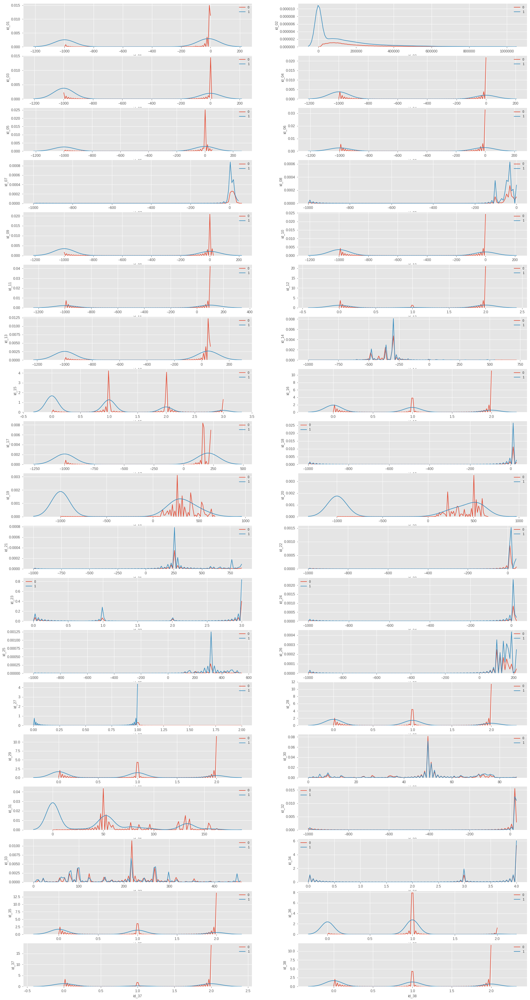

In [14]:
def id_ff(df1, df2, label1, label2, features):
    i = 0
    style.use('ggplot')
    plt.figure()
    fig, ax = plt.subplots(19,2,figsize=(30,60))

    for feature in features:
        i += 1
        plt.subplot(19,2,i)
        sns.distplot(df1[feature], hist=False,label=label1)
        sns.distplot(df2[feature], hist=False,label=label2)
        plt.ylabel(feature, fontsize=12)
        locs, labels = plt.xticks()
        plt.tick_params(axis='x', which='major', labelsize=12, pad=6)
        plt.tick_params(axis='y', which='major', labelsize=12, pad=6)
    plt.show();

id_ff(t0, t1, '0', '1', FF[11])            

## Other 

<Figure size 432x288 with 0 Axes>

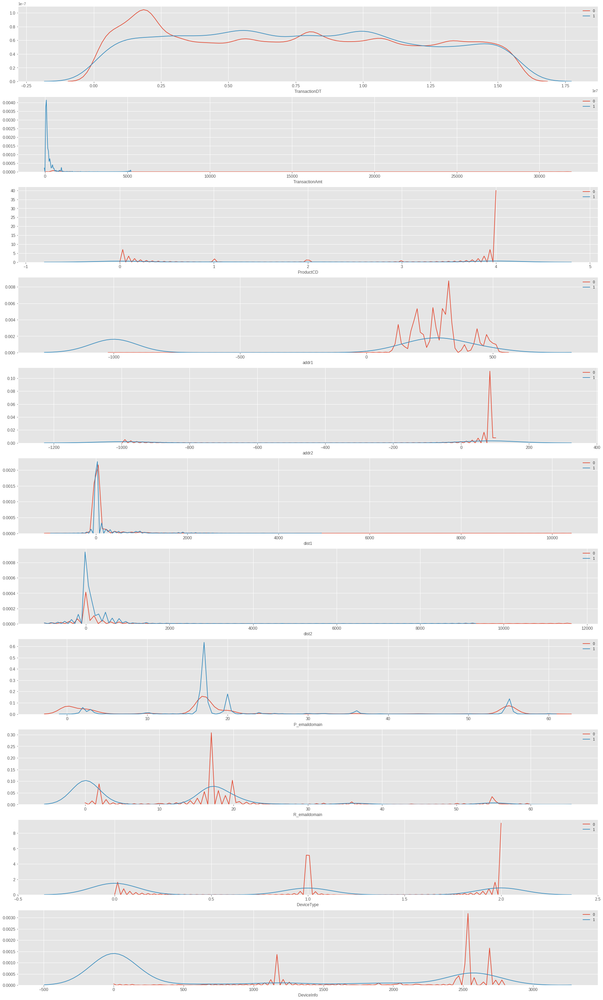

In [15]:
def o_ff(df1, df2, label1, label2, features):
    i = 0
    style.use('ggplot')
    plt.figure()
    fig, ax = plt.subplots(11,1,figsize=(30,52))

    for feature in features:
        i += 1
        plt.subplot(11,1,i)
        sns.distplot(df1[feature], hist=False,label=label1)
        sns.distplot(df2[feature], hist=False,label=label2)
        plt.xlabel(feature, fontsize=12)
        locs, labels = plt.xticks()
        plt.tick_params(axis='x', which='major', labelsize=12, pad=4)
        plt.tick_params(axis='y', which='major', labelsize=12,pad=4)
    plt.show();

o_ff(t0, t1, '0', '1', FF[12])            

 # What is Correlation?

Variables within a dataset can be related for lots of reasons.

For example:

* One variable could cause or depend on the values of another variable.
* One variable could be lightly associated with another variable.
* Two variables could depend on a third unknown variable.

It can be useful in data analysis and modeling to better understand the relationships between variables. The statistical relationship between two variables is referred to as their correlation.

A correlation could be positive, meaning both variables move in the same direction, or negative, meaning that when one variable’s value increases, the other variables’ values decrease. Correlation can also be neural or zero, meaning that the variables are unrelated.

1. > **Positive Correlation:** both variables change in the same direction.
2. > **Neutral Correlation:** No relationship in the change of the variables.
3. > **Negative Correlation:** variables change in opposite directions.

The performance of some algorithms can deteriorate if two or more variables are tightly related, called multicollinearity. An example is linear regression, where one of the offending correlated variables should be removed in order to improve the skill of the model.

We may also be interested in the correlation between input variables with the output variable in order provide insight into which variables may or may not be relevant as input for developing a model.

The structure of the relationship may be known, e.g. it may be linear, or we may have no idea whether a relationship exists between two variables or what structure it may take. Depending what is known about the relationship and the distribution of the variables, different correlation scores can be calculated.



## Card 1-6

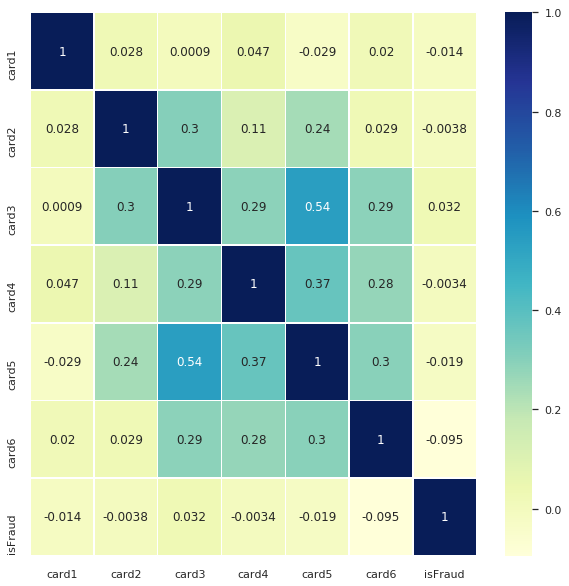

In [16]:
sns.set(rc={'figure.figsize':(10,10)})
corr=df_train[FF[0]+['isFraud']].corr()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True,cmap="YlGnBu")


## C 1-14

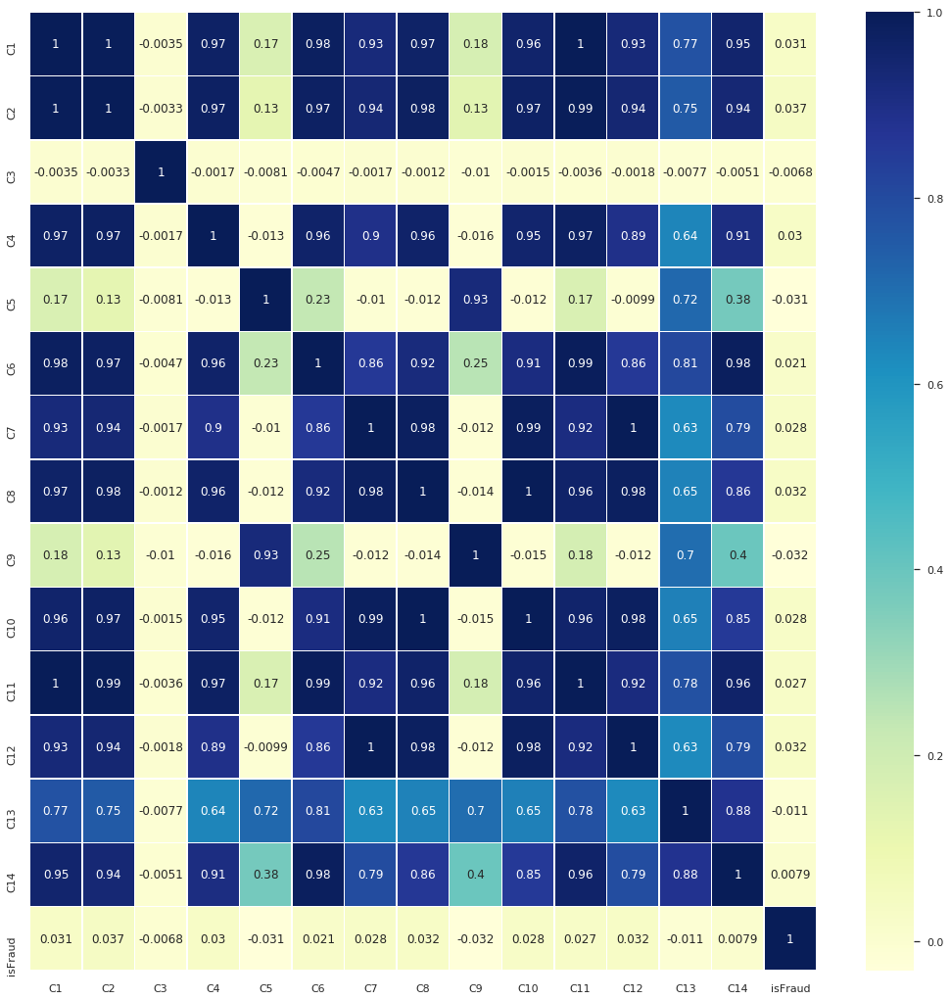

In [17]:
sns.set(rc={'figure.figsize':(18,18)})
corr=df_train[FF[1]+['isFraud']].corr()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True,cmap="YlGnBu")


## D 1-15

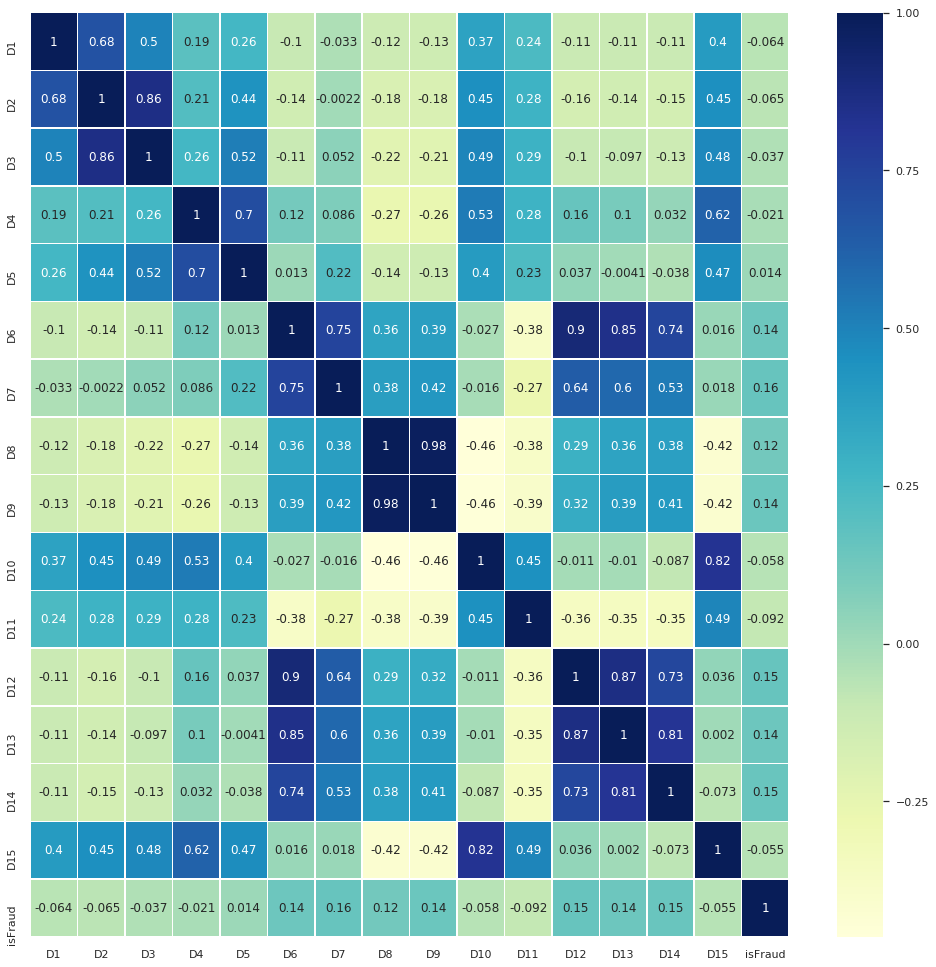

In [18]:
sns.set(rc={'figure.figsize':(17,17)})
corr=df_train[FF[2]+['isFraud']].corr()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True,cmap="YlGnBu")


## M 1-9

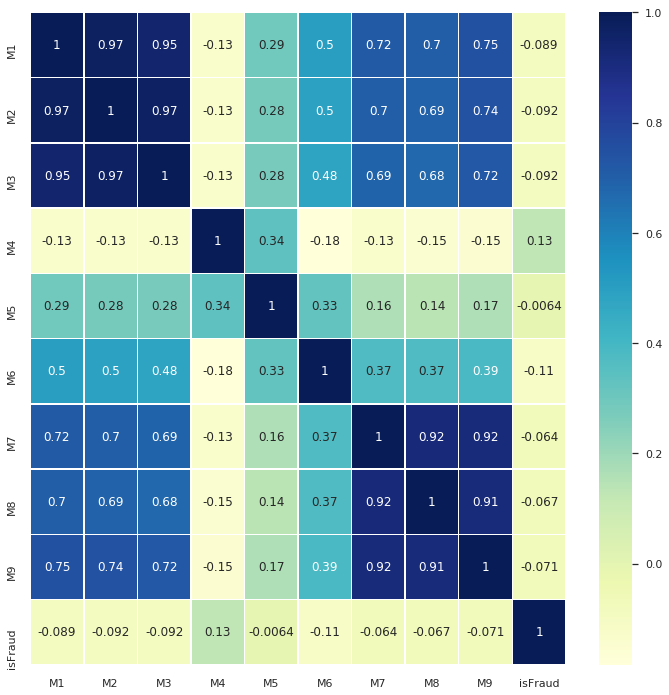

In [19]:
sns.set(rc={'figure.figsize':(12,12)})
corr=df_train[FF[3]+['isFraud']].corr()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True,cmap="YlGnBu")


## V 1-50

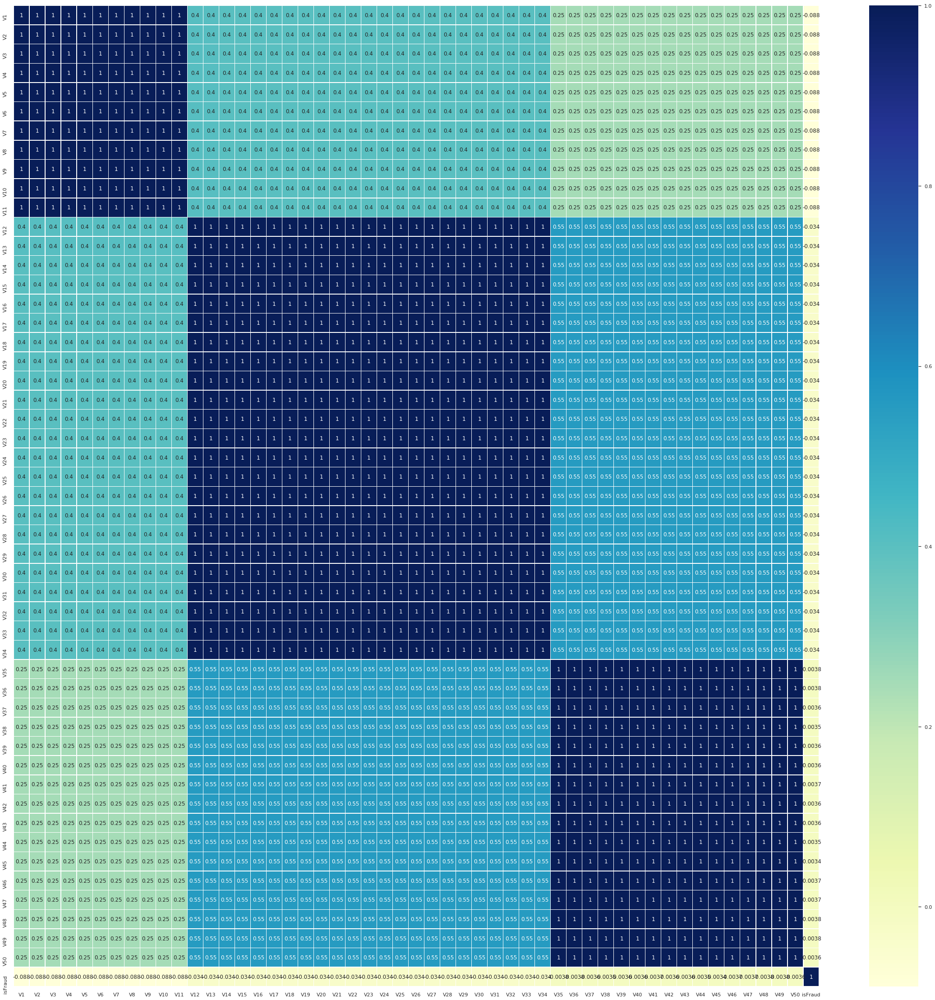

In [20]:
sns.set(rc={'figure.figsize':(40,40)})
corr=df_train[FF[4]+['isFraud']].corr()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True,cmap="YlGnBu")


## V 51-100

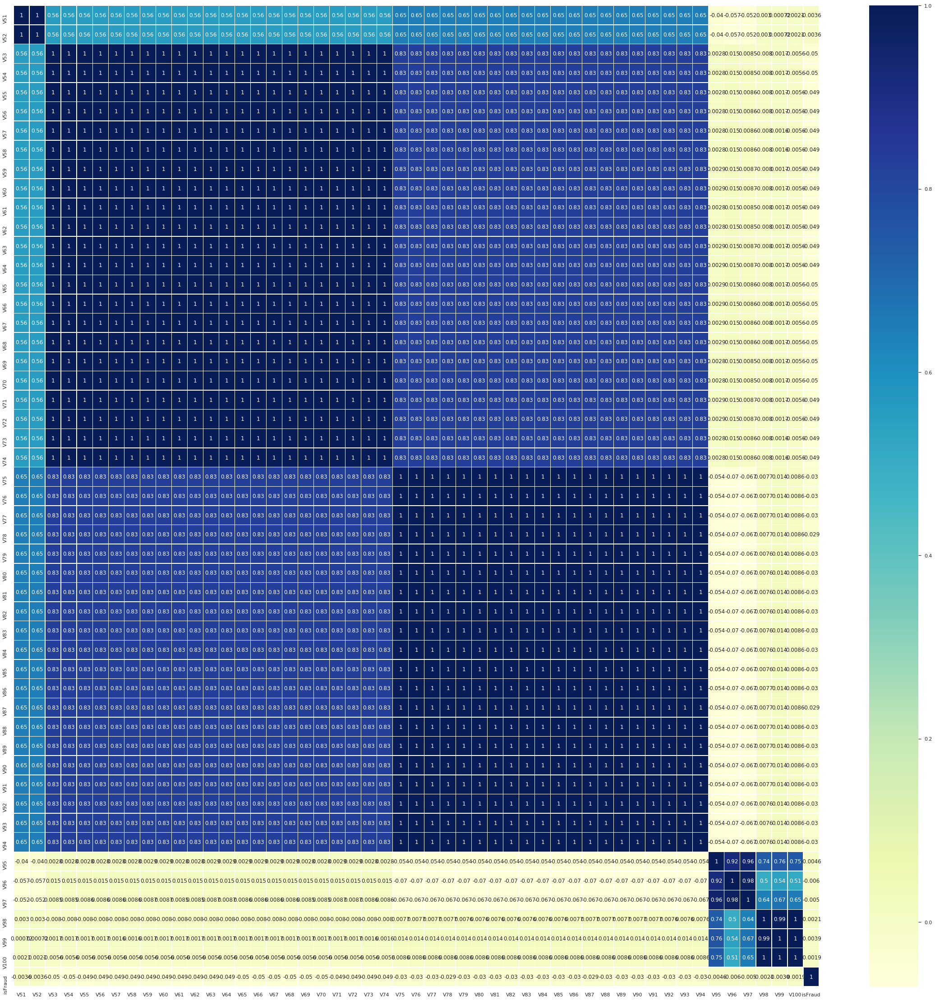

In [21]:
sns.set(rc={'figure.figsize':(40,40)})
corr=df_train[FF[5]+['isFraud']].corr()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True,cmap="YlGnBu")

## V 101-150

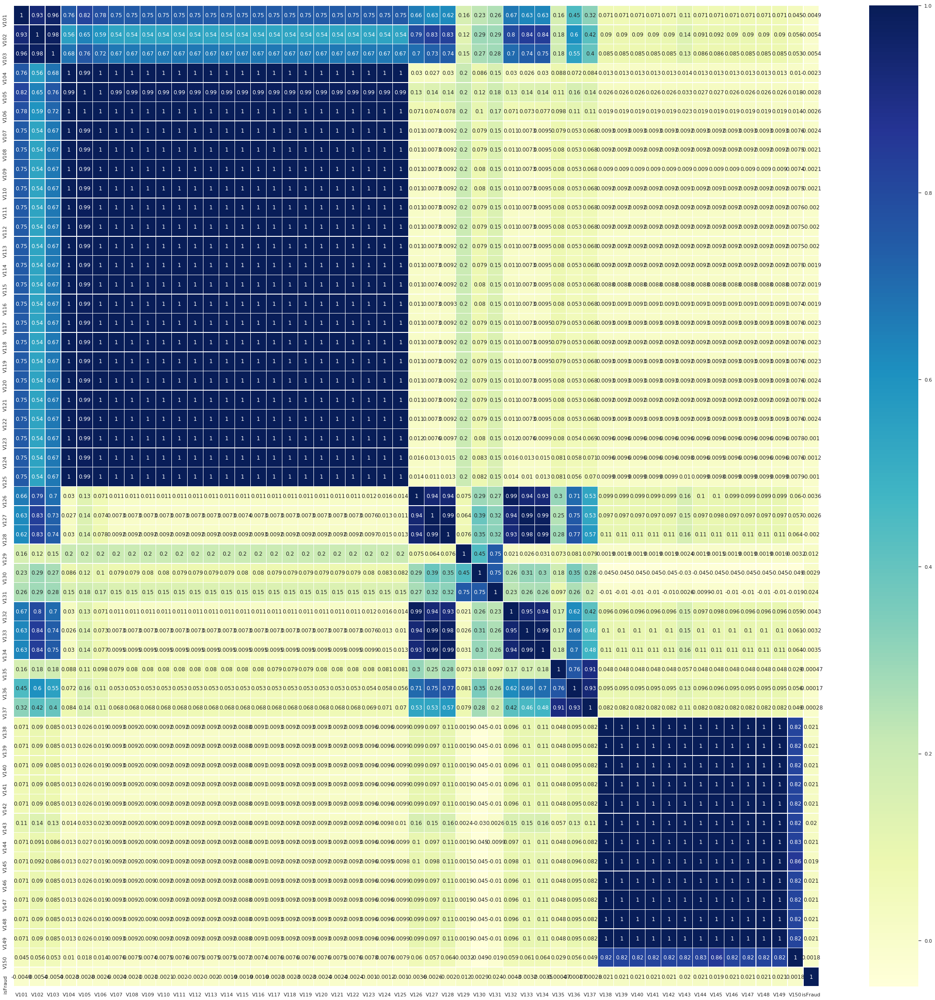

In [22]:
sns.set(rc={'figure.figsize':(40,40)})
corr=df_train[FF[6]+['isFraud']].corr()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True,cmap="YlGnBu")

## V 151-200

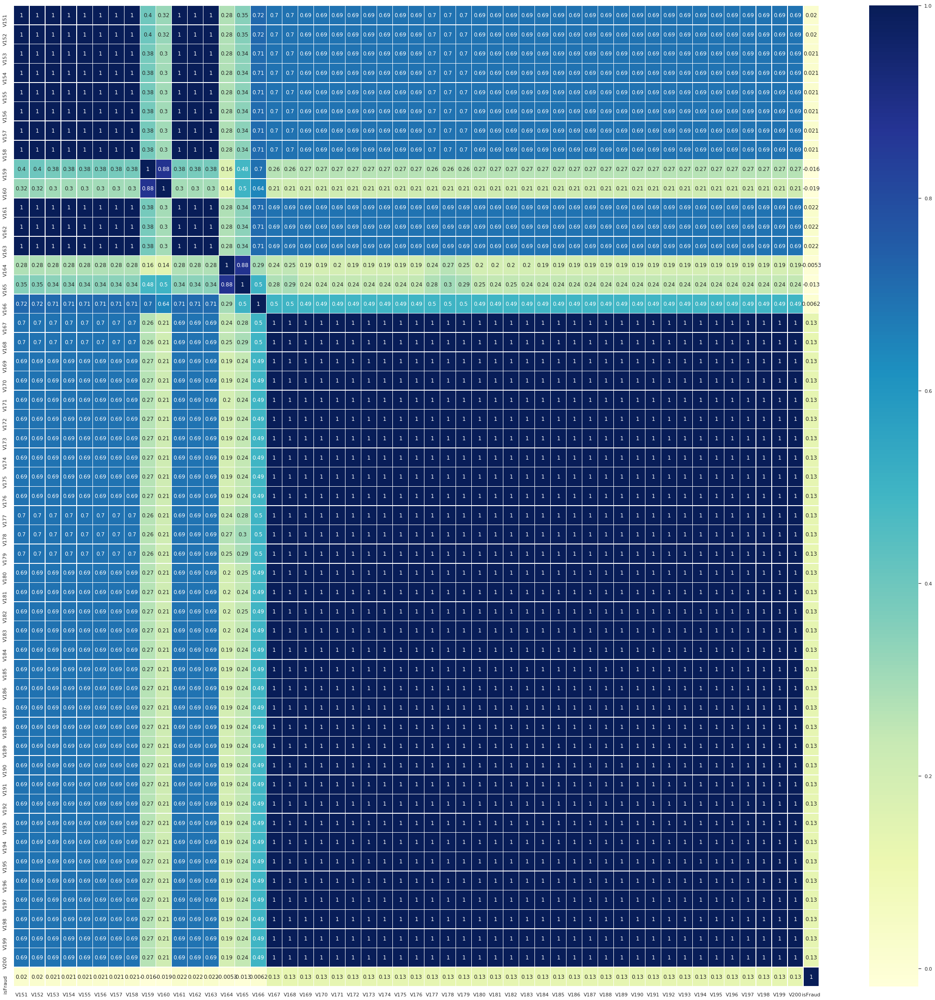

In [23]:
sns.set(rc={'figure.figsize':(40,40)})
corr=df_train[FF[7]+['isFraud']].corr()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True,cmap="YlGnBu")

## V 201-250

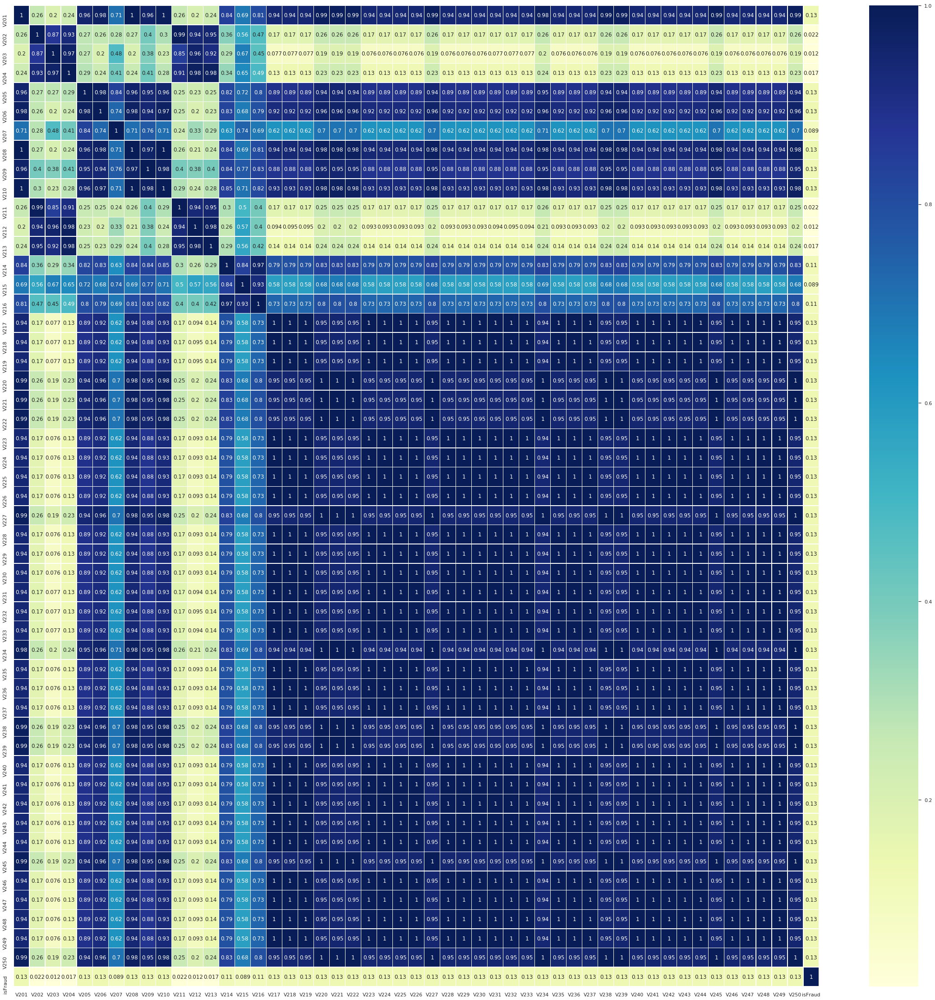

In [24]:
sns.set(rc={'figure.figsize':(40,40)})
corr=df_train[FF[8]+['isFraud']].corr()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True,cmap="YlGnBu")

## V 251-300

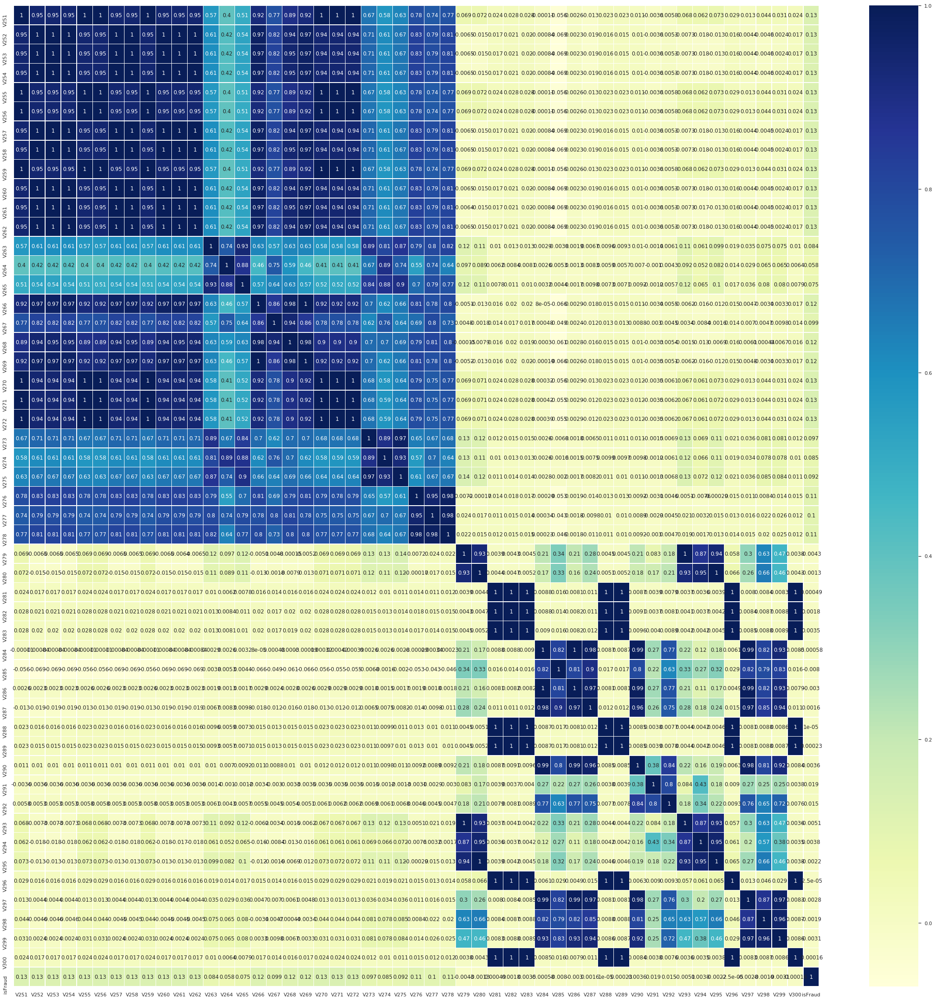

In [25]:
sns.set(rc={'figure.figsize':(40,40)})
corr=df_train[FF[9]+['isFraud']].corr()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True,cmap="YlGnBu")

## V 301-339

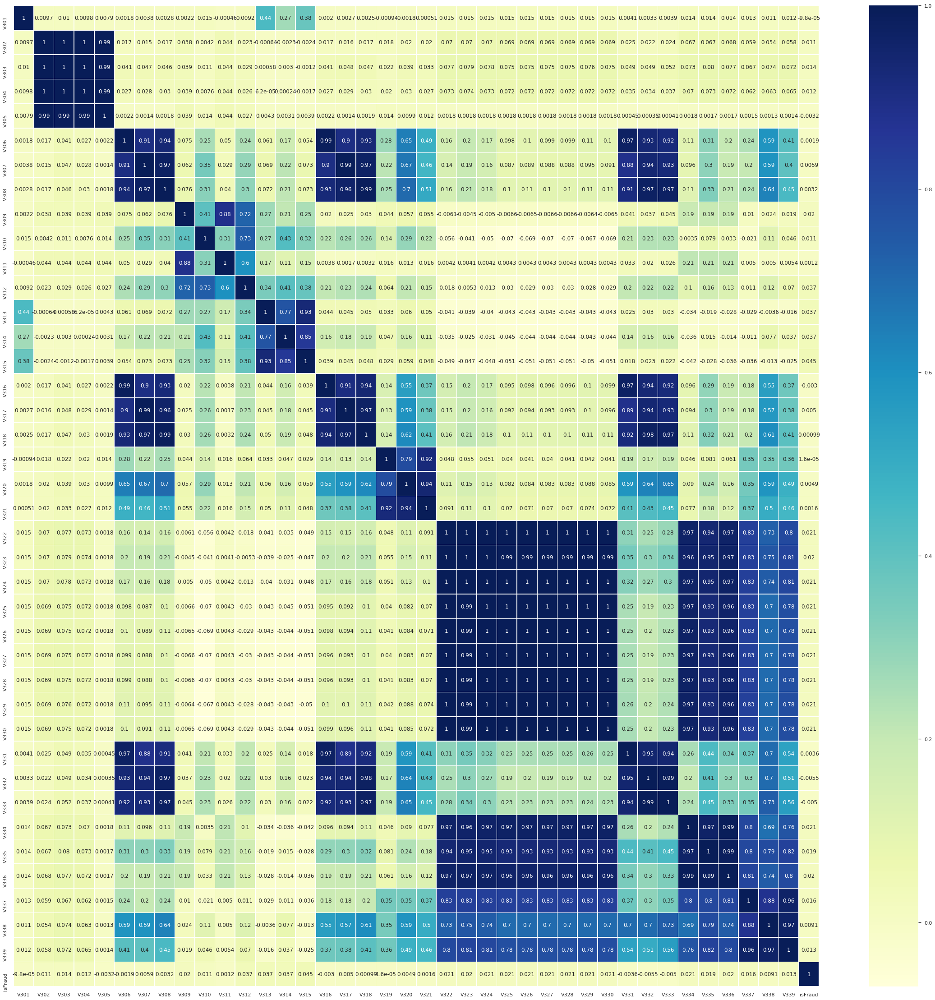

In [26]:
sns.set(rc={'figure.figsize':(40,40)})
corr=df_train[FF[10]+['isFraud']].corr()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True,cmap="YlGnBu")

## iD 1-38

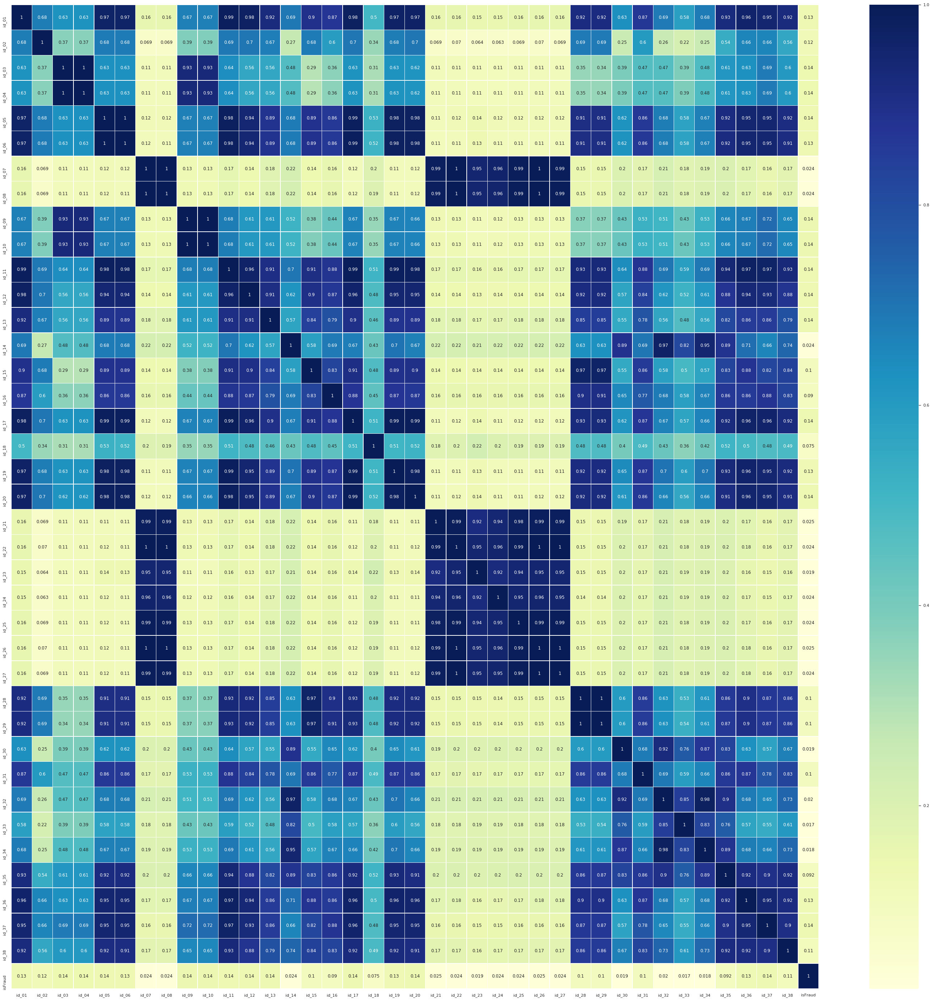

In [27]:
sns.set(rc={'figure.figsize':(50,50)})
corr=df_train[FF[11]+['isFraud']].corr()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True,cmap="YlGnBu")

## Other

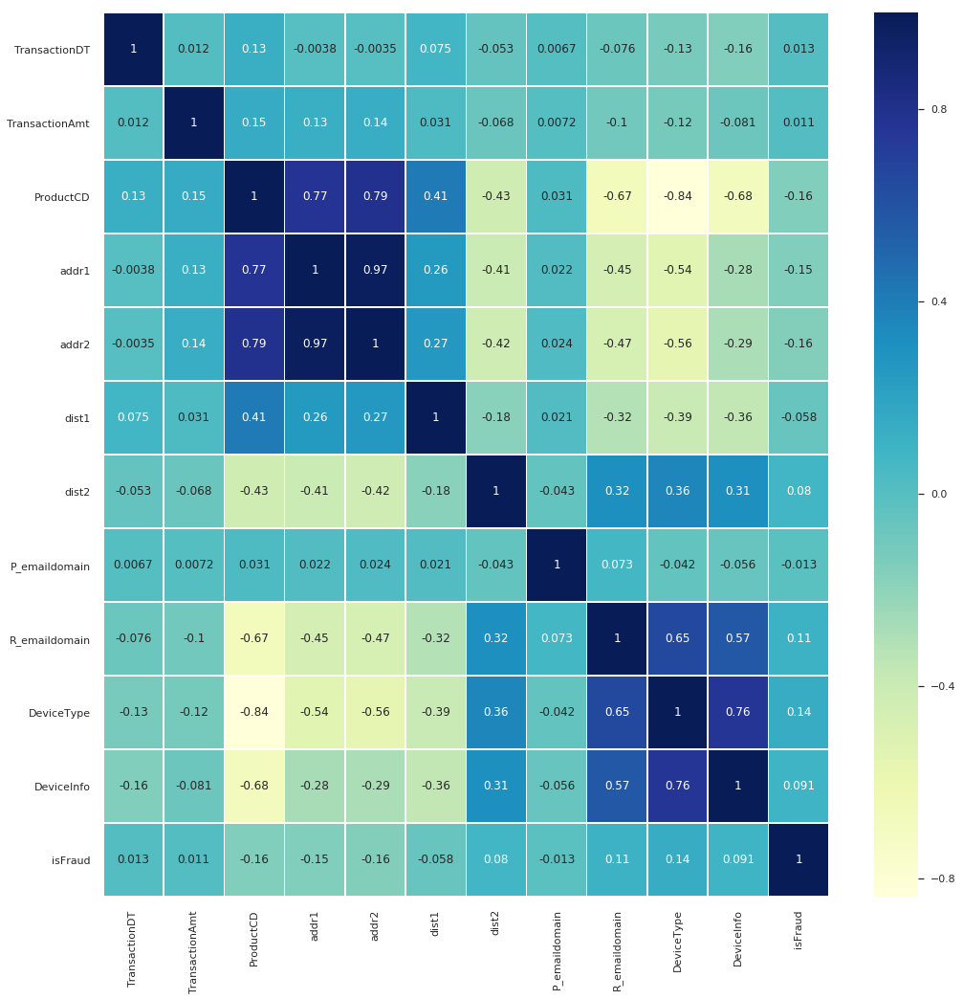

In [28]:
sns.set(rc={'figure.figsize':(17,17)})
corr=df_train[FF[12]+['isFraud']].corr()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True,cmap="YlGnBu")


# Heatmaps of Covariance

In probability, covariance is the measure of the joint probability for two random variables. It describes how the two variables change together.

## Card 1-6

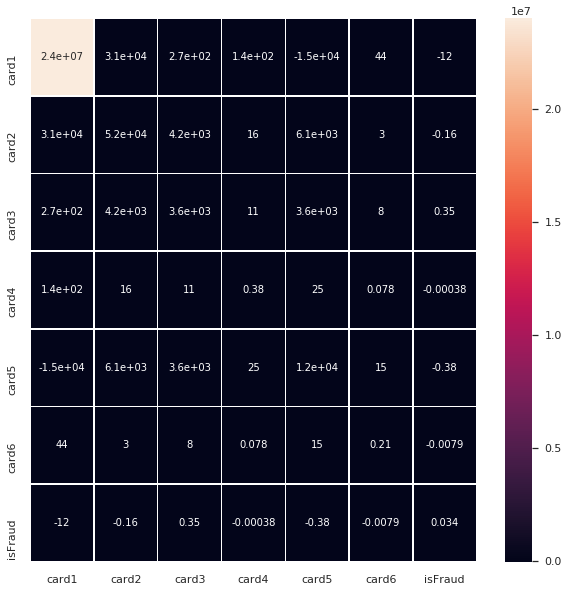

In [29]:
sns.set(rc={'figure.figsize':(10,10)})
corr=df_train[FF[0]+['isFraud']].cov()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True, annot_kws={"size": 10})


## C 1-14

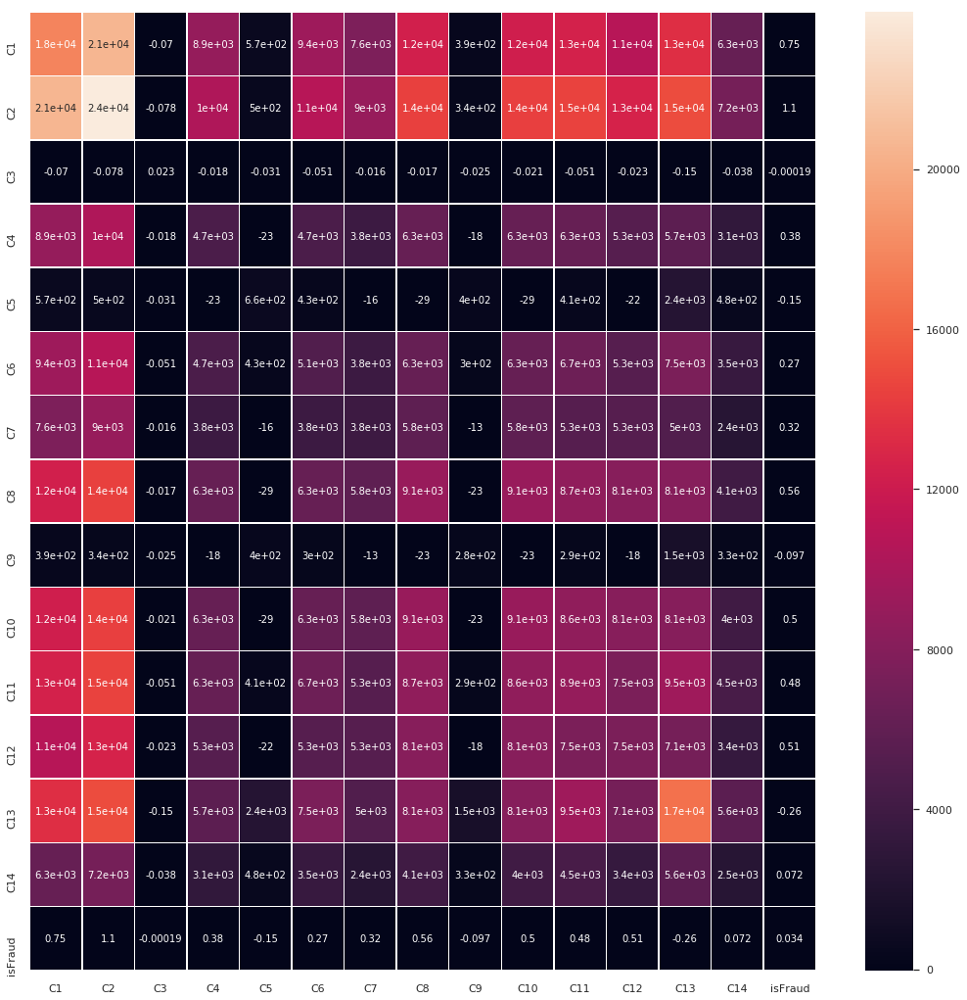

In [30]:
sns.set(rc={'figure.figsize':(18,18)})
corr=df_train[FF[1]+['isFraud']].cov()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True ,annot_kws={"size": 10})


## D 1-15

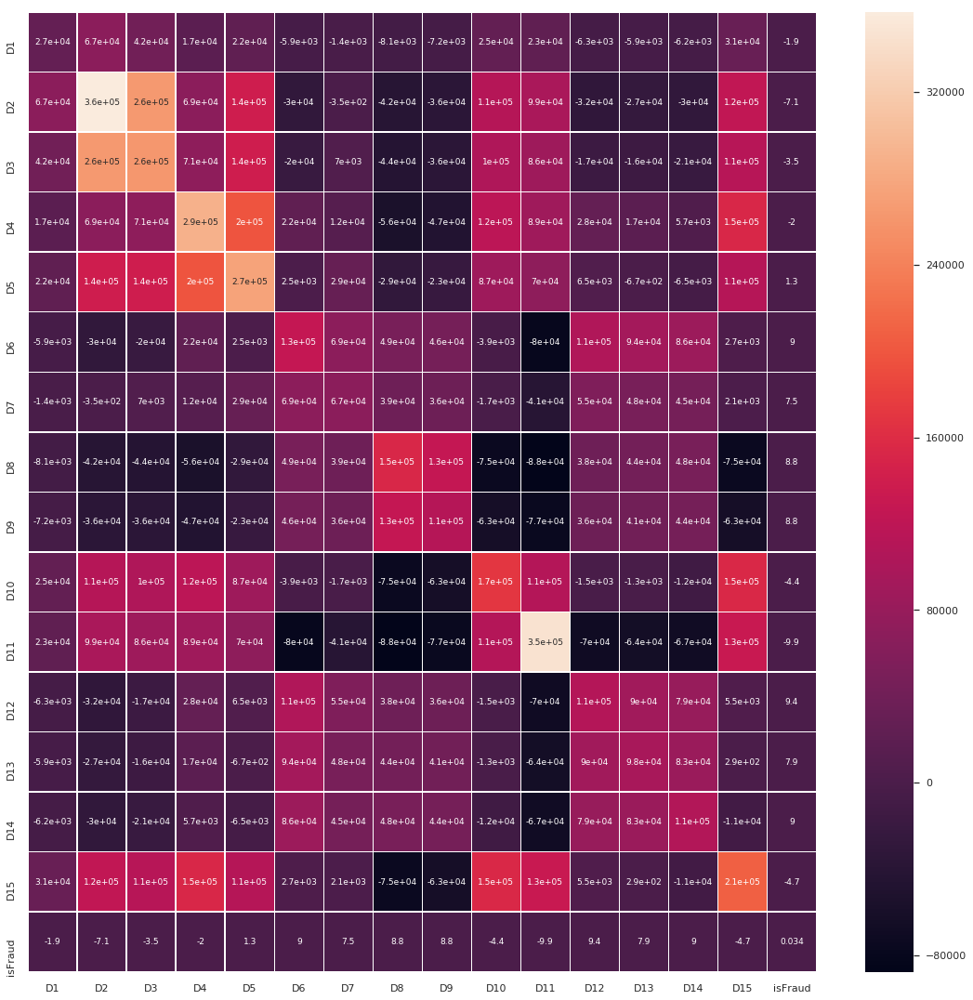

In [31]:
sns.set(rc={'figure.figsize':(19,19)})
corr=df_train[FF[2]+['isFraud']].cov()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True, annot_kws={"size": 9})


## M 1-9

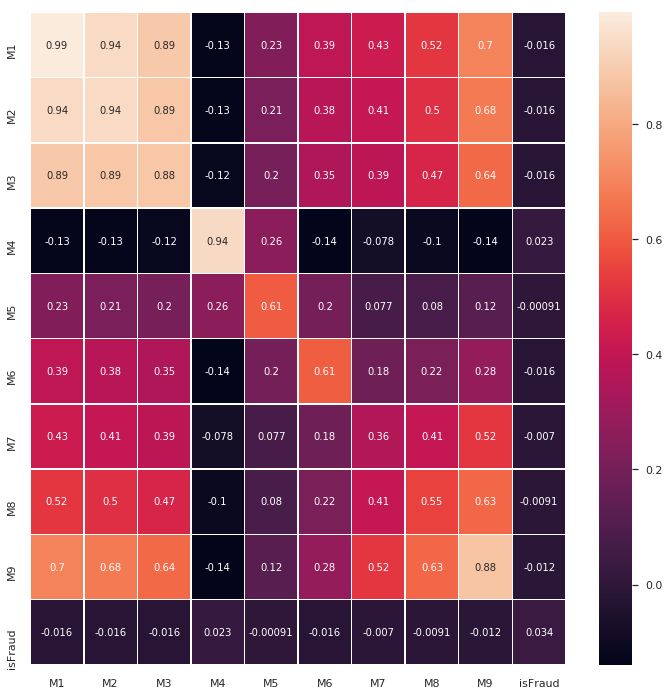

In [32]:
sns.set(rc={'figure.figsize':(12,12)})
corr=df_train[FF[3]+['isFraud']].cov()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True, annot_kws={"size": 10})


## V 1-50

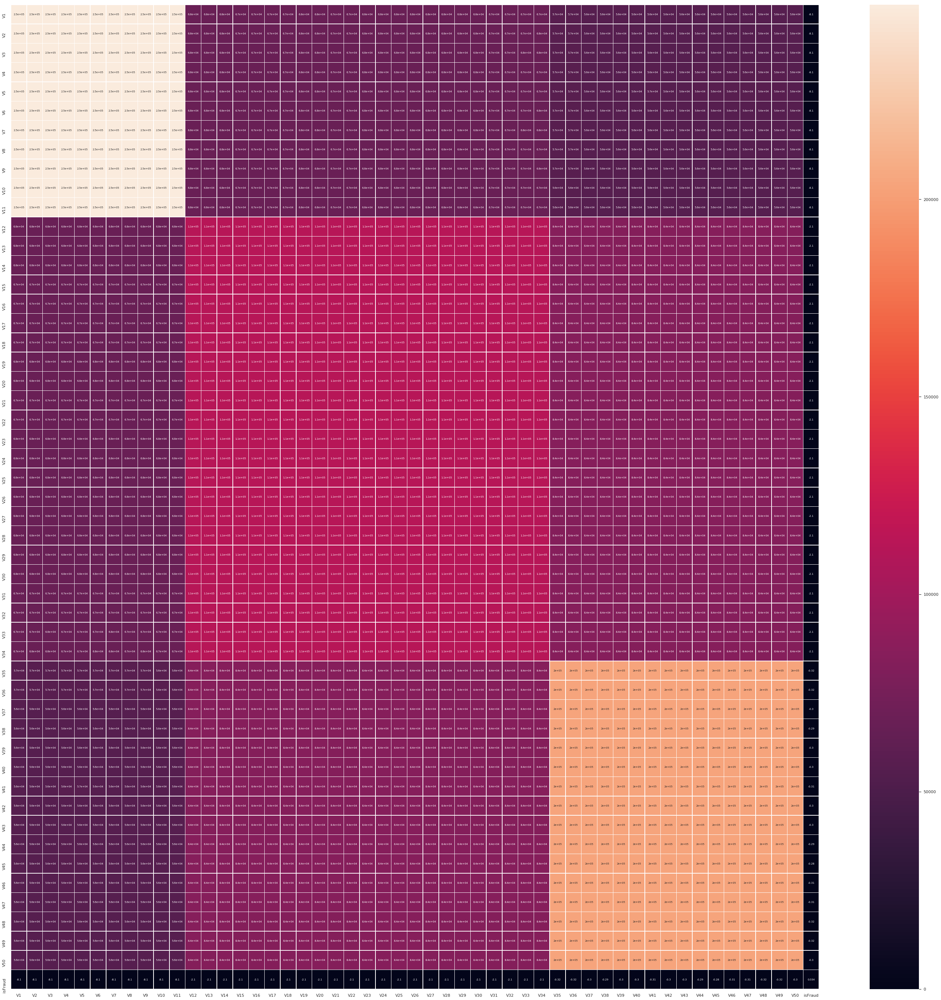

In [33]:
sns.set(rc={'figure.figsize':(50,50)})
corr=df_train[FF[4]+['isFraud']].cov()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True, annot_kws={"size":7 })


## V 51-100

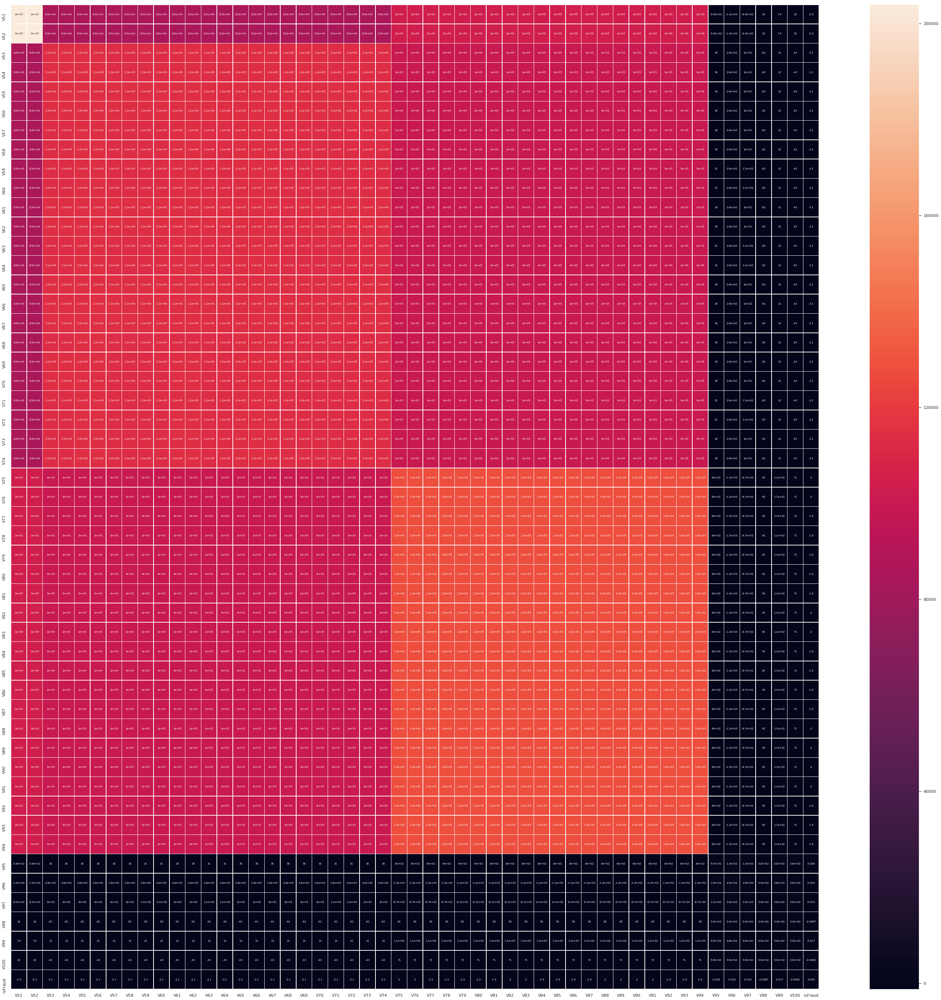

In [34]:
sns.set(rc={'figure.figsize':(50,50)})
corr=df_train[FF[5]+['isFraud']].cov()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True, annot_kws={"size": 7})

## V 101-150

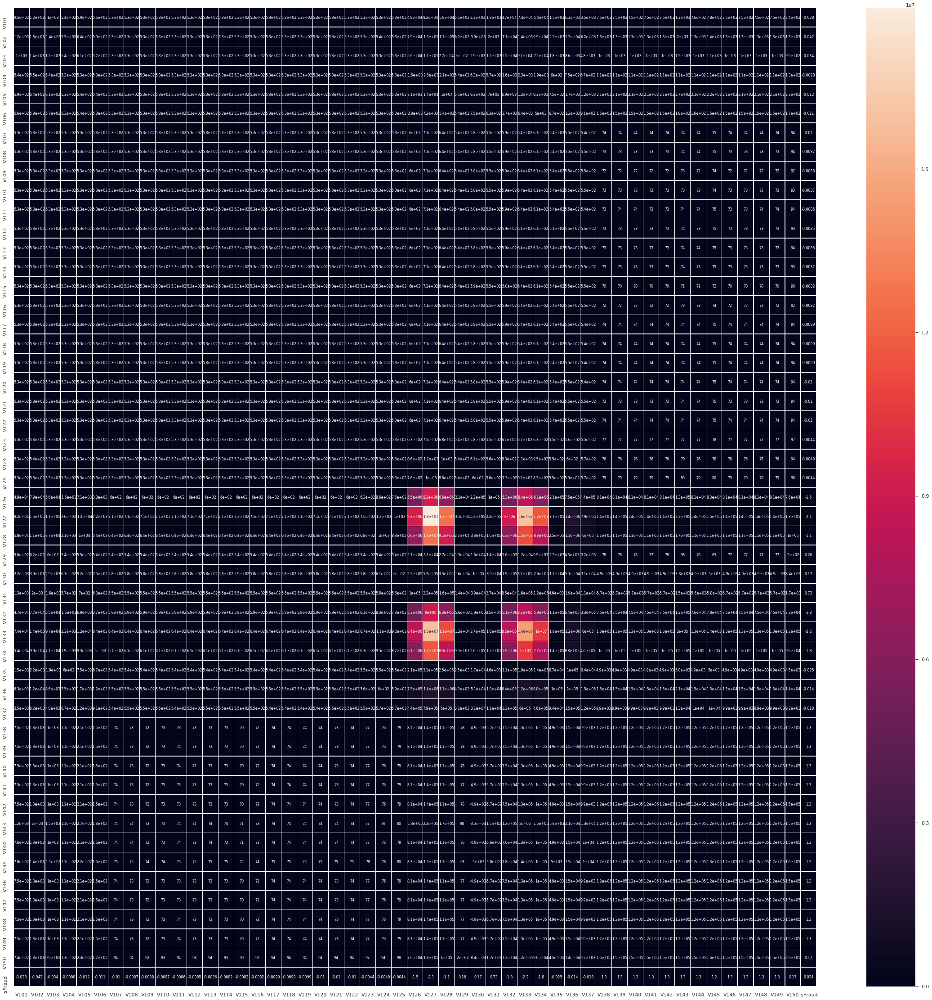

In [35]:
sns.set(rc={'figure.figsize':(40,40)})
corr=df_train[FF[6]+['isFraud']].cov()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True, annot_kws={"size": 8})

## V 151-200

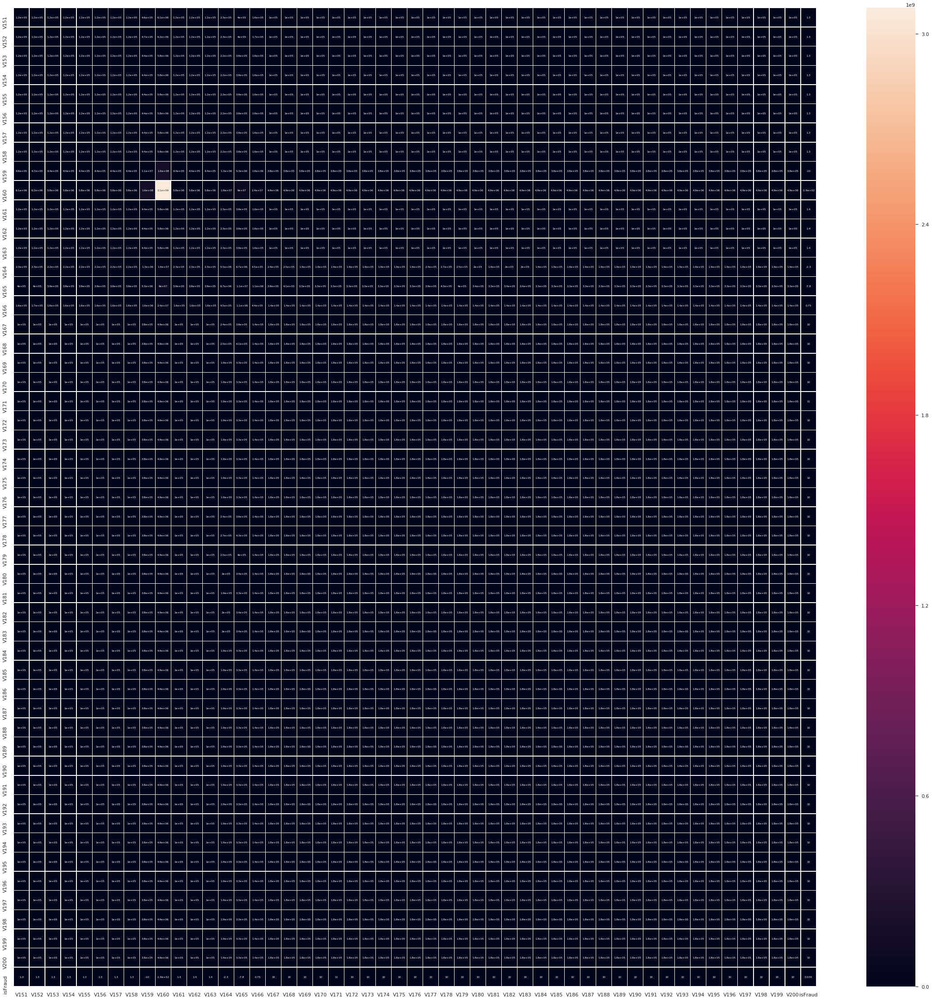

In [36]:
sns.set(rc={'figure.figsize':(40,40)})
corr=df_train[FF[7]+['isFraud']].cov()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True, annot_kws={"size": 6})

## V 201-250

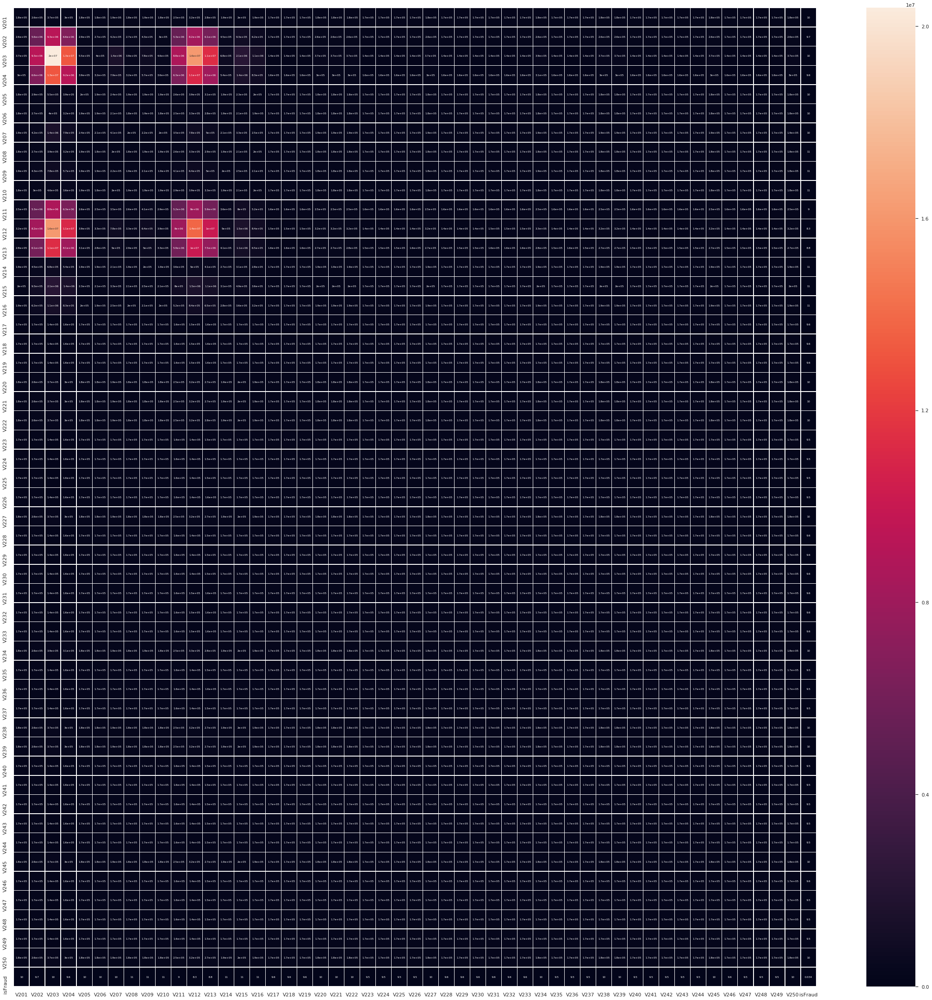

In [37]:
sns.set(rc={'figure.figsize':(40,40)})
corr=df_train[FF[8]+['isFraud']].cov()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True, annot_kws={"size": 6})

## V 251-300

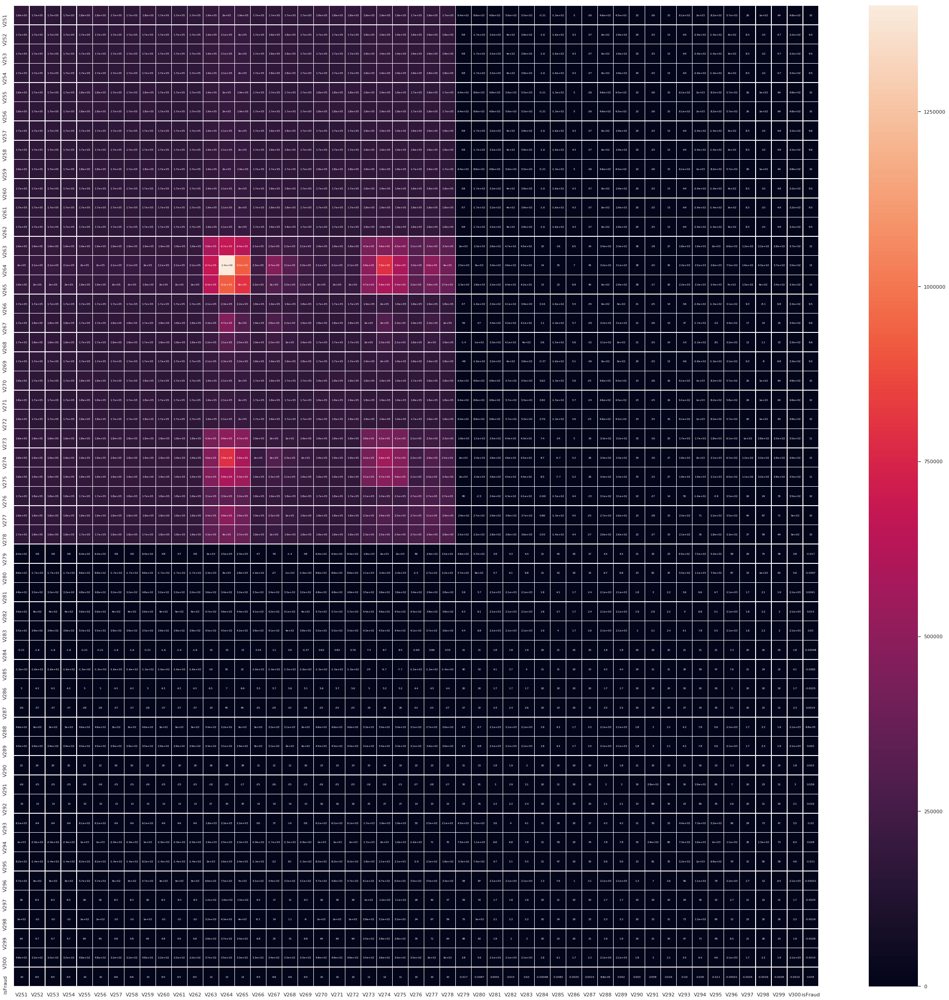

In [38]:
sns.set(rc={'figure.figsize':(40,40)})
corr=df_train[FF[9]+['isFraud']].cov()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True, annot_kws={"size":6})

## V 301-339

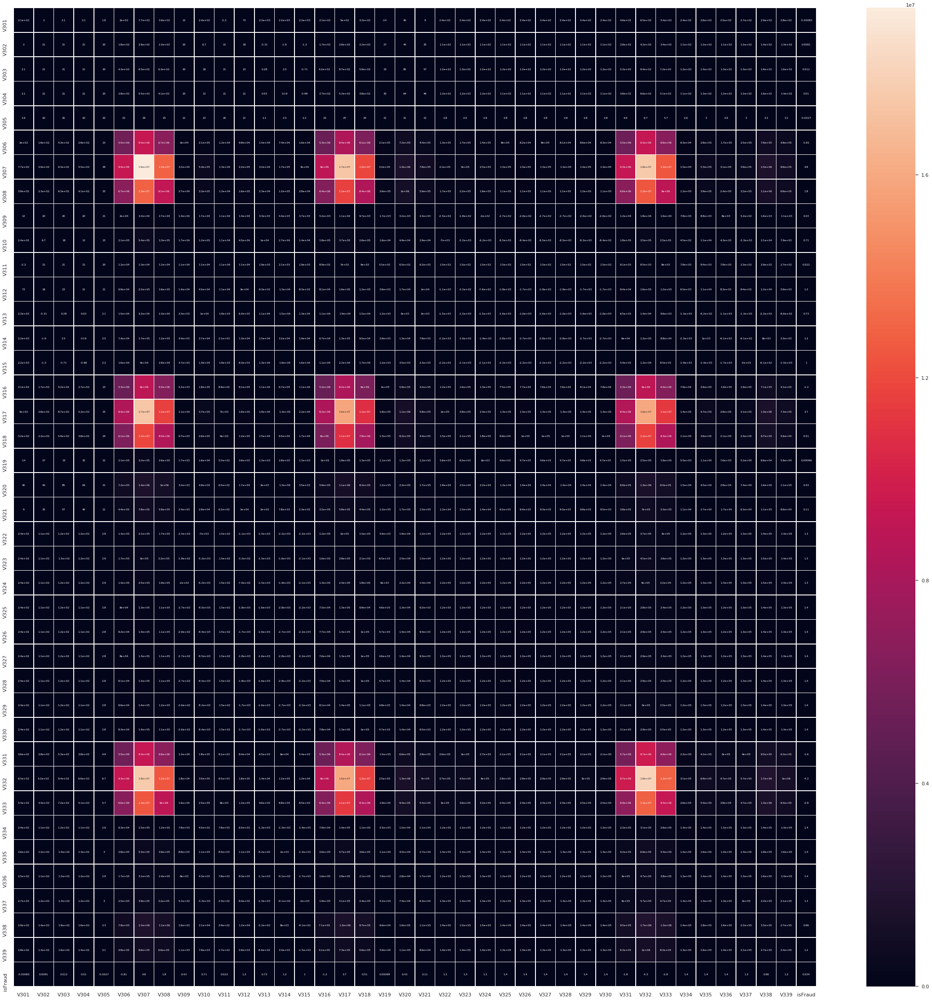

In [39]:
sns.set(rc={'figure.figsize':(40,40)})
corr=df_train[FF[10]+['isFraud']].cov()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True, annot_kws={"size": 6})

## iD 1-38

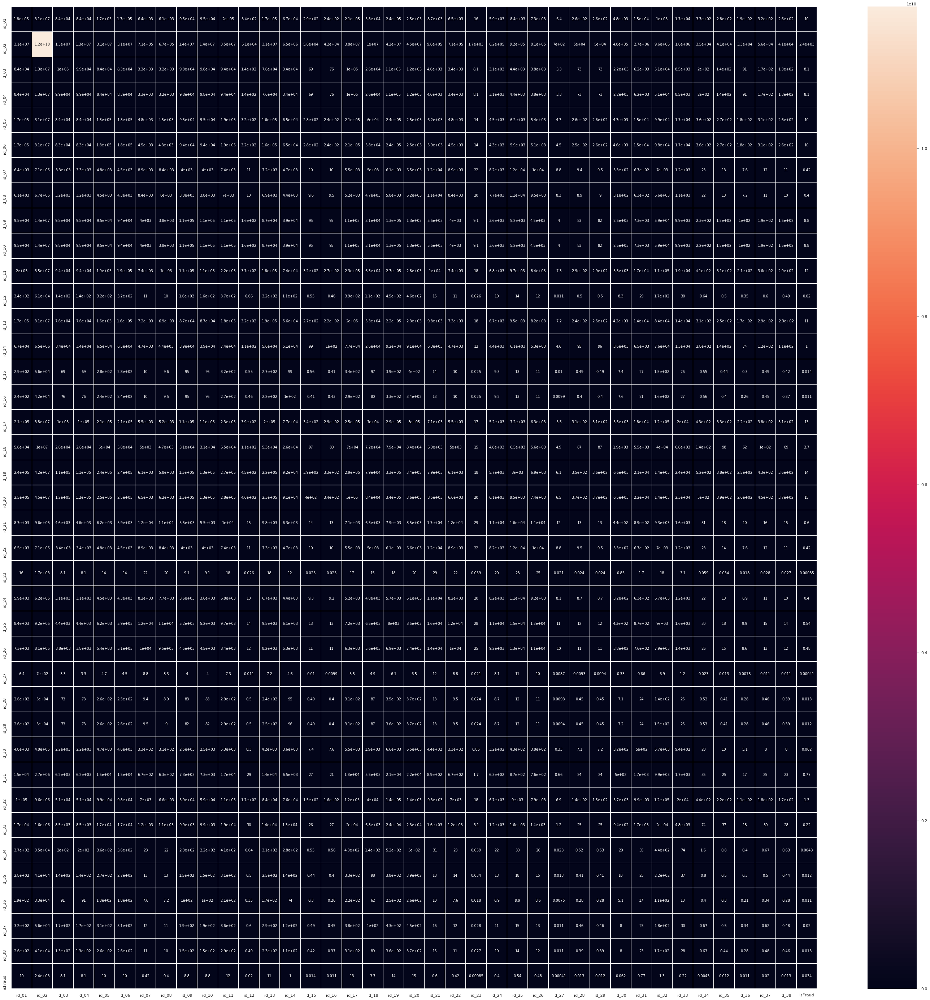

In [40]:
sns.set(rc={'figure.figsize':(50,50)})
corr=df_train[FF[11]+['isFraud']].cov()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True,annot_kws={"size": 10})

## Other

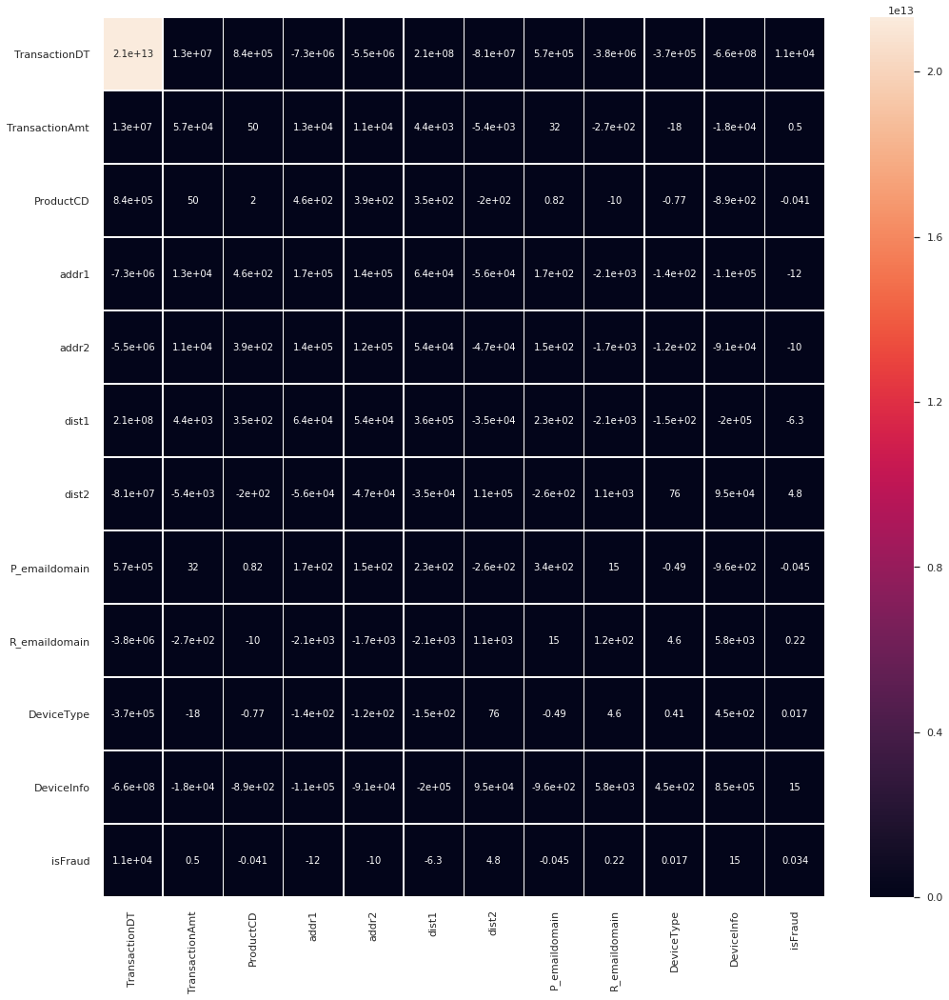

In [41]:
sns.set(rc={'figure.figsize':(17,17)})
corr=df_train[FF[12]+['isFraud']].cov()
plt.figure() 
ax = sns.heatmap(corr,linewidths=.5, annot=True,annot_kws={"size": 10})



<div style="text-align: center; color:gold"> **To be continue & UPVOTE IF YOU LIKE** </div> 
